In [5]:
import os
import torch
import pickle
import numpy as np
import shutil
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
from IPython.display import Image as IPImage
from tqdm.autonotebook import tqdm
from sentence_transformers import SentenceTransformer, util
from PIL import Image

In [6]:
#First, we load the respective CLIP model
model = SentenceTransformer('clip-ViT-B-32')

In [7]:
img_folder = '../../data/dataset'        

In [8]:
# Now, we need to compute the embeddings
# To speed things up, we destribute pre-computed embeddings
# Otherwise you can also encode the images yourself.
# To encode an image, you can use the following code:
# from PIL import Image
# img_emb = model.encode(Image.open(filepath))

# Path untuk menyimpan embeddings
embeddings_folder = '../embeddings'
emb_filename = os.path.join(embeddings_folder, 'dataset_embeddings.pkl')

# Pastikan folder embeddings ada
if not os.path.exists(embeddings_folder):
    os.makedirs(embeddings_folder)
    print(f"Folder {embeddings_folder} dibuat")

use_precomputed_embeddings = False  # Set to False since we're using our own dataset

if use_precomputed_embeddings:
    if os.path.exists(emb_filename):
        with open(emb_filename, 'rb') as fIn:
            img_names, img_emb = pickle.load(fIn)
        print("Loaded embeddings for", len(img_names), "images")
else:
    # Get all image files from the dataset folder
    img_names = []
    valid_images = [".jpg",".jpeg",".png"]  # Add more formats if needed
    for f in os.listdir(img_folder):
        ext = os.path.splitext(f)[1]
        if ext.lower() in valid_images:
            img_names.append(f)

    print("Found", len(img_names), "images in", img_folder)

    # Compute embeddings for all images with error handling dan batching
    images = []
    batch_size = 1000  # Proses 1000 gambar per batch
    total_batches = (len(img_names) + batch_size - 1) // batch_size

    all_embeddings = []
    processed_names = []

    def process_image(img_path):
        try:
            img = Image.open(img_path)
            # Pastikan gambar dalam mode RGB
            if img.mode != 'RGB':
                img = img.convert('RGB')
            # Pastikan ukuran gambar konsisten
            img = img.resize((224, 224))  # Ukuran standar untuk banyak model
            return img
        except Exception as e:
            print(f"Error processing image {img_path}: {str(e)}")
            return None

    for batch_idx in range(total_batches):
        start_idx = batch_idx * batch_size
        end_idx = min((batch_idx + 1) * batch_size, len(img_names))
        
        batch_images = []
        batch_names = []
        
        print(f"\nProcessing batch {batch_idx + 1}/{total_batches}")
        
        for img_name in tqdm(img_names[start_idx:end_idx], desc="Loading images"):
            try:
                img_path = os.path.join(img_folder, img_name)
                processed_img = process_image(img_path)
                if processed_img is not None:
                    batch_images.append(processed_img)
                    batch_names.append(img_name)
            except Exception as e:
                print(f"Error loading image {img_name}: {str(e)}")
                continue
        
        if batch_images:
            try:
                print(f"Computing embeddings for batch {batch_idx + 1}...")
                batch_embeddings = model.encode(batch_images, batch_size=32, convert_to_tensor=True, show_progress_bar=True)
                all_embeddings.append(batch_embeddings)
                processed_names.extend(batch_names)
            except Exception as e:
                print(f"Error processing batch {batch_idx + 1}: {str(e)}")
                continue
            
            # Clear batch from memory
            del batch_images
            torch.cuda.empty_cache()  # If using GPU

    # Combine all embeddings
    if all_embeddings:
        img_emb = torch.cat(all_embeddings, dim=0)
        img_names = processed_names

        print(f"Successfully processed {len(img_names)} images")

        # Simpan embeddings ke folder embeddings
        with open(emb_filename, 'wb') as fOut:
            pickle.dump((img_names, img_emb), fOut)
        print(f"Embeddings saved to {emb_filename}")
    else:
        print("No embeddings were generated!")


Found 10281 images in ../../data/dataset

Processing batch 1/11


Loading images: 100%|██████████| 1000/1000 [00:10<00:00, 98.97it/s]


Computing embeddings for batch 1...


Batches: 100%|██████████| 32/32 [00:04<00:00,  7.45it/s]



Processing batch 2/11


Loading images: 100%|██████████| 1000/1000 [00:08<00:00, 115.51it/s]


Computing embeddings for batch 2...


Batches: 100%|██████████| 32/32 [00:04<00:00,  7.76it/s]



Processing batch 3/11


Loading images: 100%|██████████| 1000/1000 [00:08<00:00, 119.49it/s]


Computing embeddings for batch 3...


Batches: 100%|██████████| 32/32 [00:04<00:00,  7.45it/s]



Processing batch 4/11


Loading images: 100%|██████████| 1000/1000 [00:08<00:00, 115.90it/s]


Computing embeddings for batch 4...


Batches: 100%|██████████| 32/32 [00:04<00:00,  7.51it/s]



Processing batch 5/11


Loading images: 100%|██████████| 1000/1000 [00:07<00:00, 125.46it/s]


Computing embeddings for batch 5...


Batches: 100%|██████████| 32/32 [00:04<00:00,  7.65it/s]



Processing batch 6/11


Loading images: 100%|██████████| 1000/1000 [00:08<00:00, 111.27it/s]


Computing embeddings for batch 6...


Batches: 100%|██████████| 32/32 [00:04<00:00,  7.32it/s]



Processing batch 7/11


Loading images: 100%|██████████| 1000/1000 [00:08<00:00, 117.78it/s]


Computing embeddings for batch 7...


Batches: 100%|██████████| 32/32 [00:04<00:00,  7.49it/s]



Processing batch 8/11


Loading images: 100%|██████████| 1000/1000 [00:09<00:00, 103.06it/s]


Computing embeddings for batch 8...


Batches: 100%|██████████| 32/32 [00:04<00:00,  7.59it/s]



Processing batch 9/11


Loading images: 100%|██████████| 1000/1000 [00:10<00:00, 94.95it/s]


Computing embeddings for batch 9...


Batches: 100%|██████████| 32/32 [00:04<00:00,  7.55it/s]



Processing batch 10/11


Loading images: 100%|██████████| 1000/1000 [00:08<00:00, 121.95it/s]


Computing embeddings for batch 10...


Batches: 100%|██████████| 32/32 [00:04<00:00,  7.32it/s]



Processing batch 11/11


Loading images: 100%|██████████| 281/281 [00:02<00:00, 115.31it/s]


Computing embeddings for batch 11...


Batches: 100%|██████████| 9/9 [00:01<00:00,  7.40it/s]


Successfully processed 10281 images
Embeddings saved to ../embeddings\dataset_embeddings.pkl


In [9]:
# Ambil 10 gambar pertama dan hitung similarity matrix seperti sebelumnya
num_images = 10
first_10_embeddings = img_emb[:num_images]
similarity_matrix = util.cos_sim(first_10_embeddings, first_10_embeddings)
similarity_matrix_np = similarity_matrix.cpu().numpy()

# Buat data untuk DataFrame
data = []
for i in range(num_images):
    row = {
        'Reference': f'Image {i+1}',  # Gambar referensi
    }
    # Tambahkan nilai similarity untuk setiap gambar
    for j in range(num_images):
        row[f'Image_{j+1}'] = similarity_matrix_np[i][j]
    data.append(row)

# Buat DataFrame
df = pd.DataFrame(data)

# Tambahkan styling untuk tampilan yang lebih baik
styled_df = df.style.format({col: '{:.4f}' for col in df.columns if col not in ['Image_No', 'Reference']})
styled_df = styled_df.background_gradient(cmap='YlOrRd', subset=[col for col in df.columns if col not in ['Image_No', 'Reference']])

# Tampilkan DataFrame dengan styling
display(styled_df)

# Set format tampilan
pd.set_option('display.float_format', lambda x: '%.4f' % x)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

,Reference,Image_1,Image_2,Image_3,Image_4,Image_5,Image_6,Image_7,Image_8,Image_9,Image_10
0,Image 1,1.0000,0.3664,0.4467,0.5124,0.3597,0.3695,0.3299,0.3010,0.3698,0.2798
1,Image 2,0.3664,1.0000,0.5492,0.4045,0.6461,0.5416,0.5663,0.5216,0.5843,0.5103
2,Image 3,0.4467,0.5492,1.0000,0.7167,0.6671,0.6653,0.6301,0.5899,0.6670,0.3904
3,Image 4,0.5124,0.4045,0.7167,1.0000,0.5081,0.5314,0.4664,0.4794,0.5056,0.3486
4,Image 5,0.3597,0.6461,0.6671,0.5081,1.0000,0.8607,0.9025,0.8469,0.9039,0.6730
5,Image 6,0.3695,0.5416,0.6653,0.5314,0.8607,1.0000,0.9333,0.9418,0.9183,0.6027
6,Image 7,0.3299,0.5663,0.6301,0.4664,0.9025,0.9333,1.0000,0.9443,0.9519,0.6438
7,Image 8,0.3010,0.5216,0.5899,0.4794,0.8469,0.9418,0.9443,1.0000,0.9257,0.6360
8,Image 9,0.3698,0.5843,0.6670,0.5056,0.9039,0.9183,0.9519,0.9257,1.0000,0.6165
9,Image 10,0.2798,0.5103,0.3904,0.3486,0.6730,0.6027,0.6438,0.6360,0.6165,1.0000



Perbandingan Berurutan dengan Image 1:


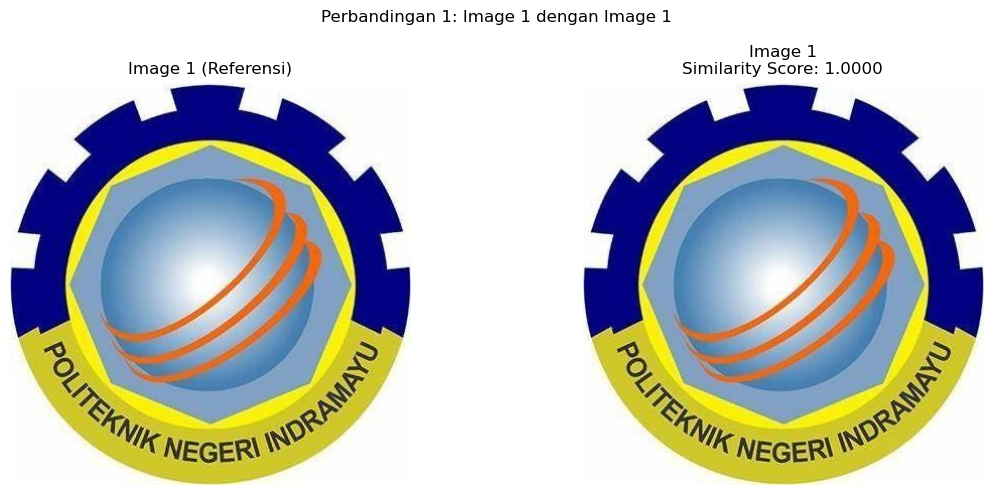

--------------------------------------------------


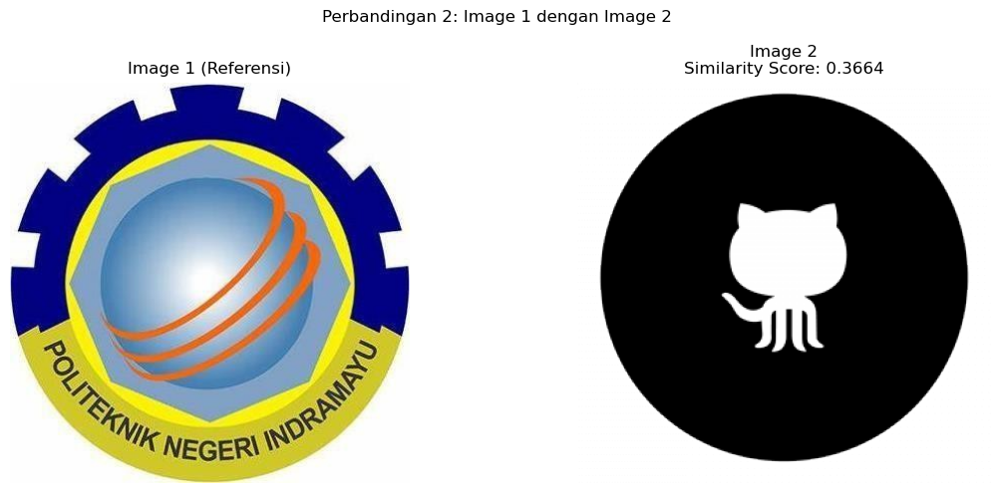

--------------------------------------------------


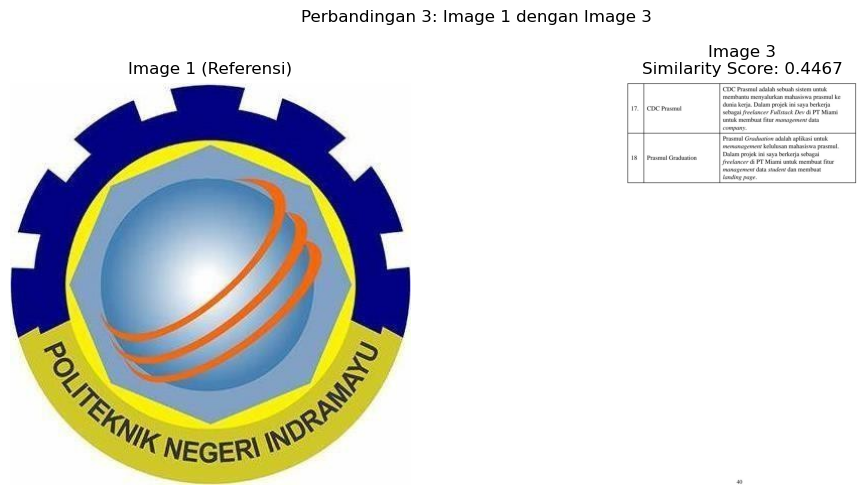

--------------------------------------------------


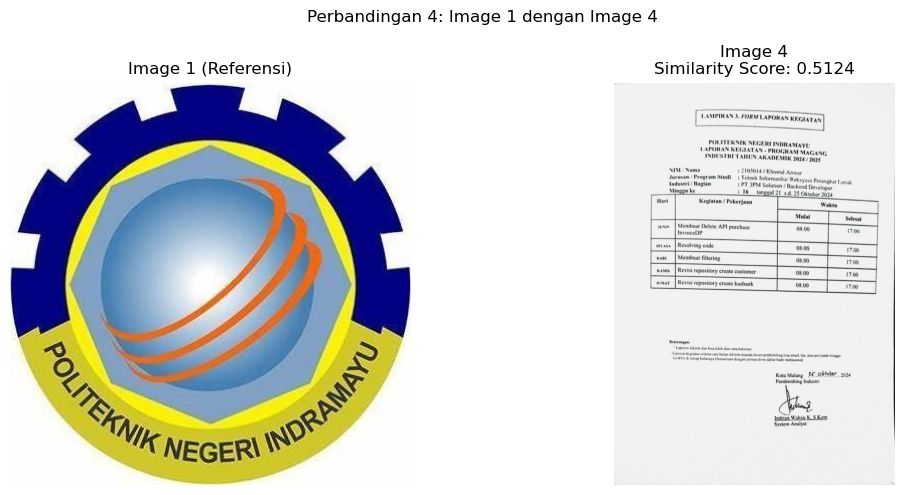

--------------------------------------------------


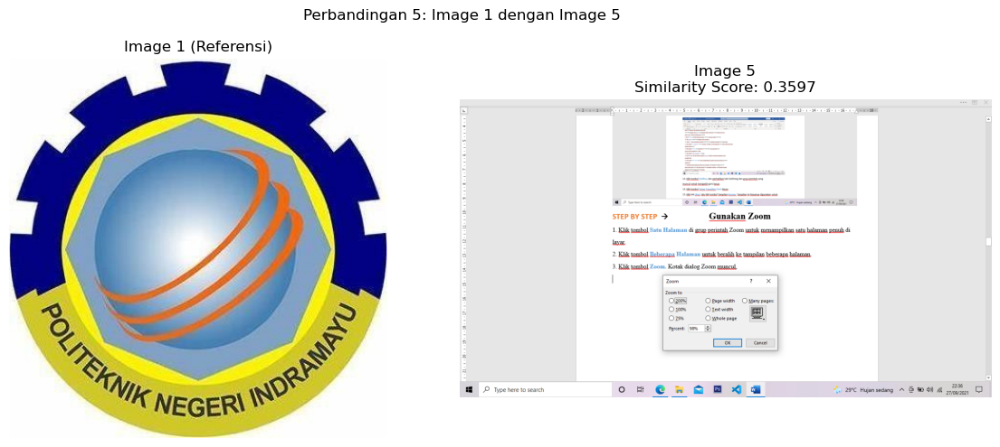

--------------------------------------------------


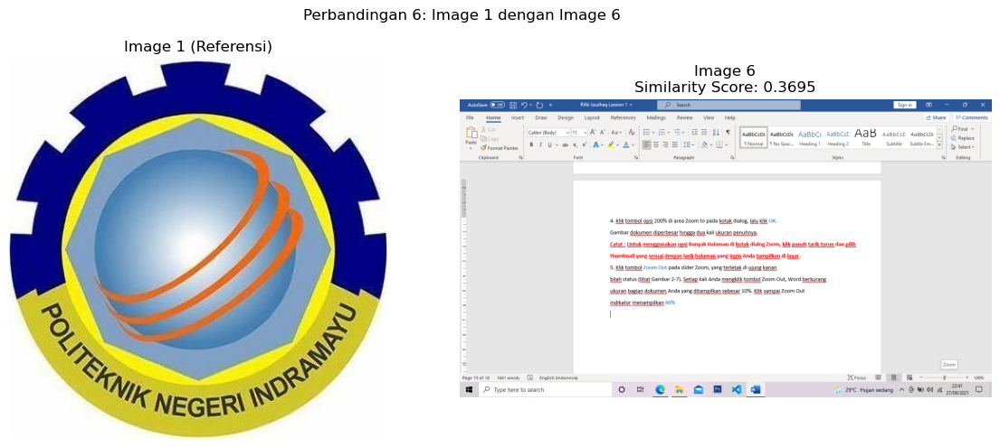

--------------------------------------------------


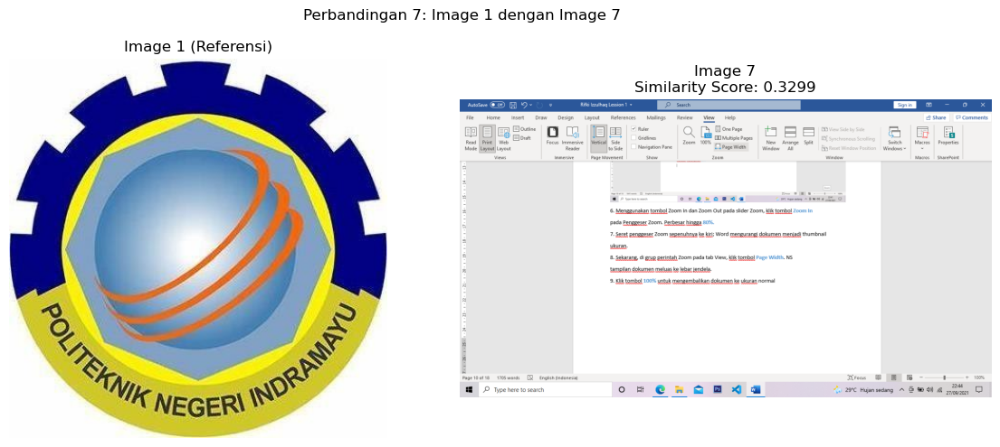

--------------------------------------------------


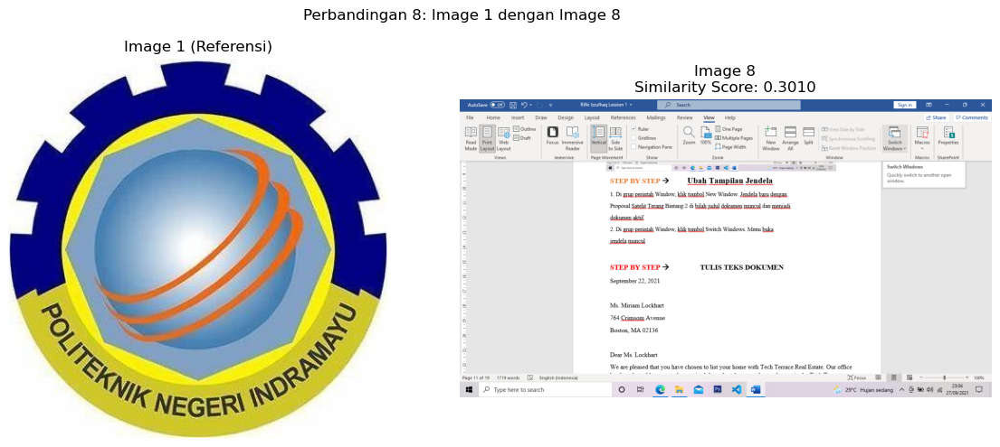

--------------------------------------------------


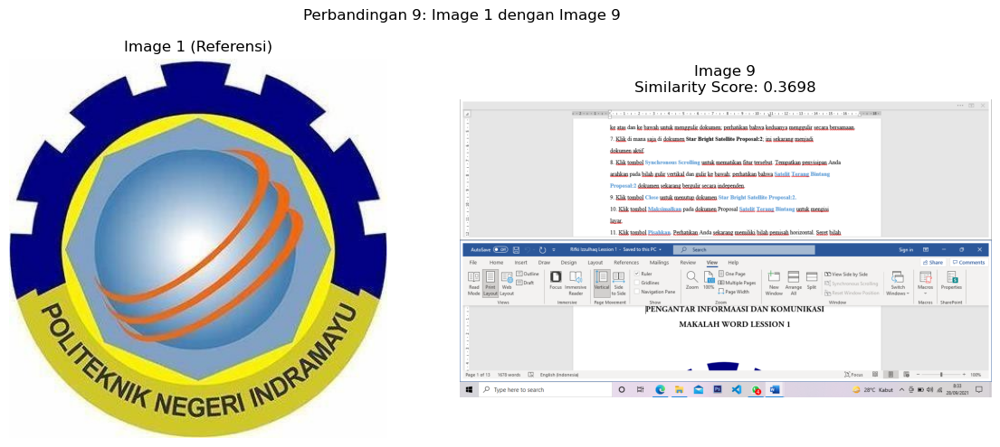

--------------------------------------------------


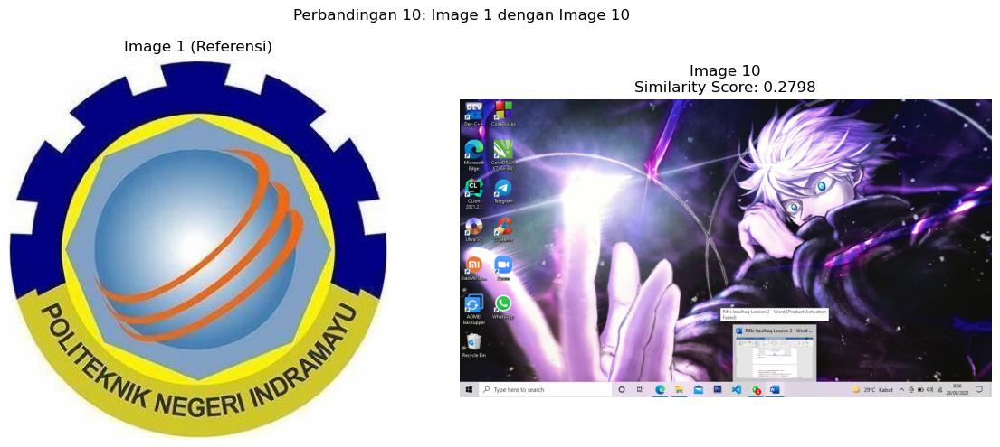

--------------------------------------------------


In [10]:
# Tampilkan perbandingan Image 1 dengan semua gambar secara berdampingan
reference_img_idx = 0  # Image 1 sebagai referensi
reference_img_path = os.path.join(img_folder, img_names[reference_img_idx])

print("\nPerbandingan Berurutan dengan Image 1:")

for i in range(num_images):
    similarity_score = similarity_matrix_np[reference_img_idx][i]
    
    # Buat figure baru untuk setiap perbandingan
    plt.figure(figsize=(12, 5))
    
    # Subplot untuk gambar referensi (Image 1)
    plt.subplot(1, 2, 1)
    ref_img = Image.open(reference_img_path)
    plt.imshow(ref_img)
    plt.title(f'Image 1 (Referensi)')
    plt.axis('off')
    
    # Subplot untuk gambar pembanding
    plt.subplot(1, 2, 2)
    comp_img = Image.open(os.path.join(img_folder, img_names[i]))
    plt.imshow(comp_img)
    plt.title(f'Image {i+1}\nSimilarity Score: {similarity_score:.4f}')
    plt.axis('off')
    
    plt.suptitle(f'Perbandingan {i+1}: Image 1 dengan Image {i+1}')
    plt.tight_layout()
    plt.show()
    print("-" * 50)

In [11]:
def plot_similarity_heatmap(similarity_matrix, title, labels=None):
    plt.figure(figsize=(12, 10))
    
    # Matikan label axis jika terlalu banyak data
    if len(similarity_matrix) > 50:  # Jika data lebih dari 50
        show_labels = False
    else:
        show_labels = True
    
    sns.heatmap(similarity_matrix, 
                annot=False,  
                cmap='YlOrRd',
                xticklabels=labels if show_labels else False,  # Matikan label jika data terlalu banyak
                yticklabels=labels if show_labels else False,  # Matikan label jika data terlalu banyak
                cbar=True)
    
    plt.title(title)
    plt.tight_layout()
    plt.show()

In [12]:
# # Batasi jumlah gambar yang akan dihitung similarity-nya
# MAX_IMAGES = 20  # Ubah angka ini sesuai kebutuhan

Heatmap Similarity Matrix Sebelum Clustering:


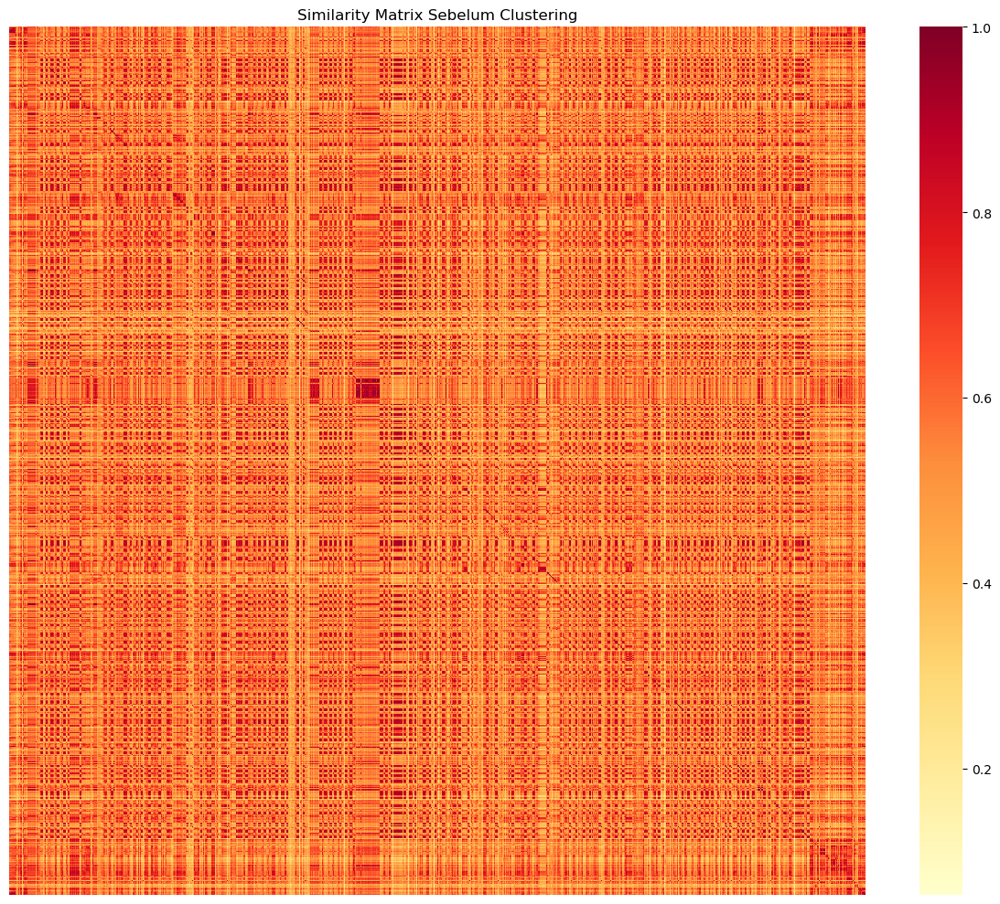

In [13]:
# Visualisasi heatmap sebelum clustering
print("Heatmap Similarity Matrix Sebelum Clustering:")
similarity_matrix_all = util.cos_sim(img_emb, img_emb)
similarity_matrix_all_np = similarity_matrix_all.cpu().numpy()
plot_similarity_heatmap(similarity_matrix_all_np, 
                       'Similarity Matrix Sebelum Clustering')

In [14]:
img_emb.shape

torch.Size([10281, 512])

In [15]:
# We have implemented our own, efficient method
# to find high density regions in vector space
def community_detection(embeddings, threshold, min_community_size=10, init_max_size=None):
    """
    Function for Fast Community Detection

    Finds in the embeddings all communities, i.e. embeddings that are close (closer than threshold).

    Returns only communities that are larger than min_community_size. The communities are returned
    in decreasing order. The first element in each list is the central point in the community.
    """
    # If init_max_size is not specified, use the number of embeddings
    if init_max_size is None:
        init_max_size = len(embeddings)

    # Compute cosine similarity scores
    cos_scores = util.cos_sim(embeddings, embeddings)

    # Minimum size for a community
    top_k_values, _ = cos_scores.topk(k=min(min_community_size, len(embeddings)), largest=True)

    # Filter for rows >= min_threshold
    extracted_communities = []
    for i in range(len(top_k_values)):
        if top_k_values[i][-1] >= threshold:
            new_cluster = []

            # Only check top k most similar entries
            top_val_large, top_idx_large = cos_scores[i].topk(k=min(init_max_size, len(embeddings)), largest=True)
            top_idx_large = top_idx_large.tolist()
            top_val_large = top_val_large.tolist()

            if top_val_large[-1] < threshold:
                for idx, val in zip(top_idx_large, top_val_large):
                    if val < threshold:
                        break
                    new_cluster.append(idx)
            else:
                # Iterate over all entries (slow)
                for idx, val in enumerate(cos_scores[i].tolist()):
                    if val >= threshold:
                        new_cluster.append(idx)

            extracted_communities.append(new_cluster)

    # Largest cluster first
    extracted_communities = sorted(extracted_communities, key=lambda x: len(x), reverse=True)

    # Step 2) Remove overlapping communities
    unique_communities = []
    extracted_ids = set()

    for community in extracted_communities:
        add_cluster = True
        for idx in community:
            if idx in extracted_ids:
                add_cluster = False
                break

        if add_cluster:
            unique_communities.append(community)
            for idx in community:
                extracted_ids.add(idx)

    return unique_communities

In [16]:
# Now we run the clustering algorithm
# With the threshold parameter, we define at which threshold we identify
# two images as similar. Set the threshold lower, and you will get larger clusters which have 
# less similar images in it (e.g. black cat images vs. cat images vs. animal images).
# With min_community_size, we define that we only want to have clusters of a certain minimal size
clusters = community_detection(img_emb, threshold=0.87, min_community_size=2)
print("Total number of clusters:", len(clusters))

Total number of clusters: 629



Heatmap Similarity Matrix Setelah Clustering:


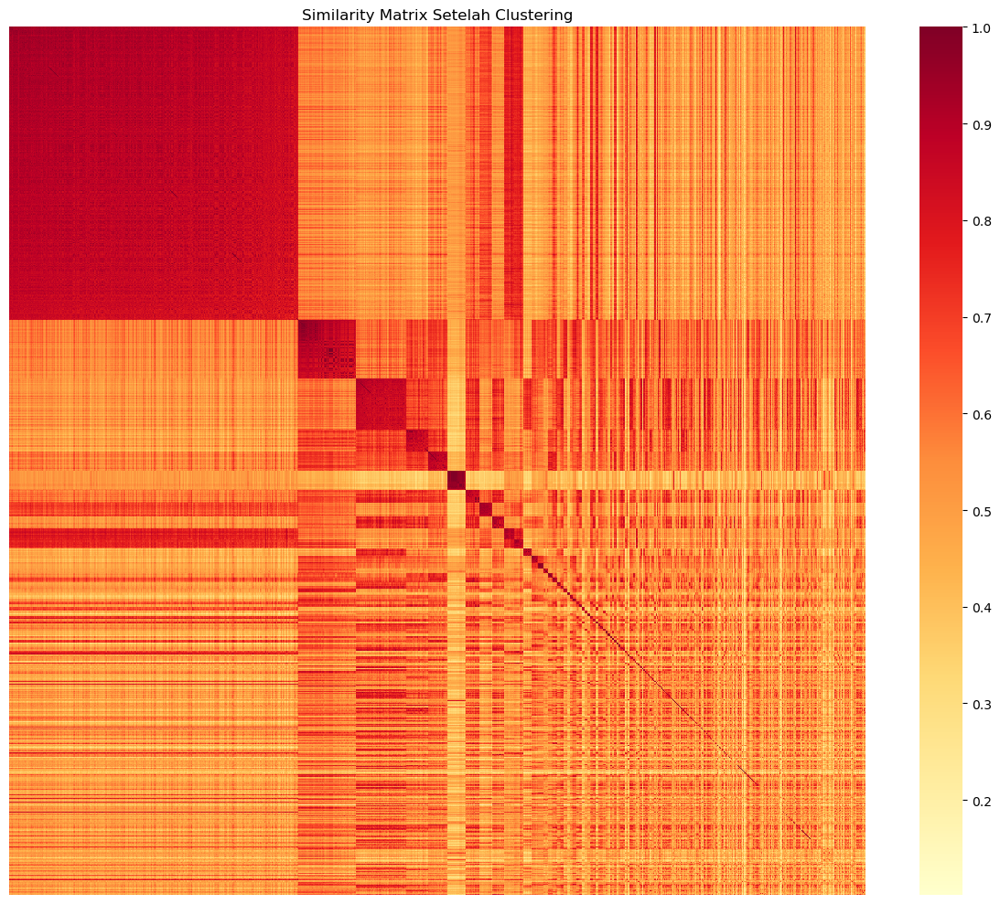

In [17]:
# Visualisasi setelah clustering
print("\nHeatmap Similarity Matrix Setelah Clustering:")
clustered_indices = []
cluster_labels = []

for cluster_idx, cluster in enumerate(clusters):
    clustered_indices.extend(cluster)
    cluster_labels.extend([f'C{cluster_idx+1}_I{i+1}' for i in range(len(cluster))])

clustered_embeddings = img_emb[clustered_indices]
similarity_matrix_clustered = util.cos_sim(clustered_embeddings, clustered_embeddings)
similarity_matrix_clustered_np = similarity_matrix_clustered.cpu().numpy()

plot_similarity_heatmap(similarity_matrix_clustered_np, 
                       'Similarity Matrix Setelah Clustering',
                       cluster_labels if len(cluster_labels) <= 50 else None)


Menampilkan 5 cluster terbesar (max 10 gambar per cluster):

Cluster 1, Size: 2537
--------------------------------------------------


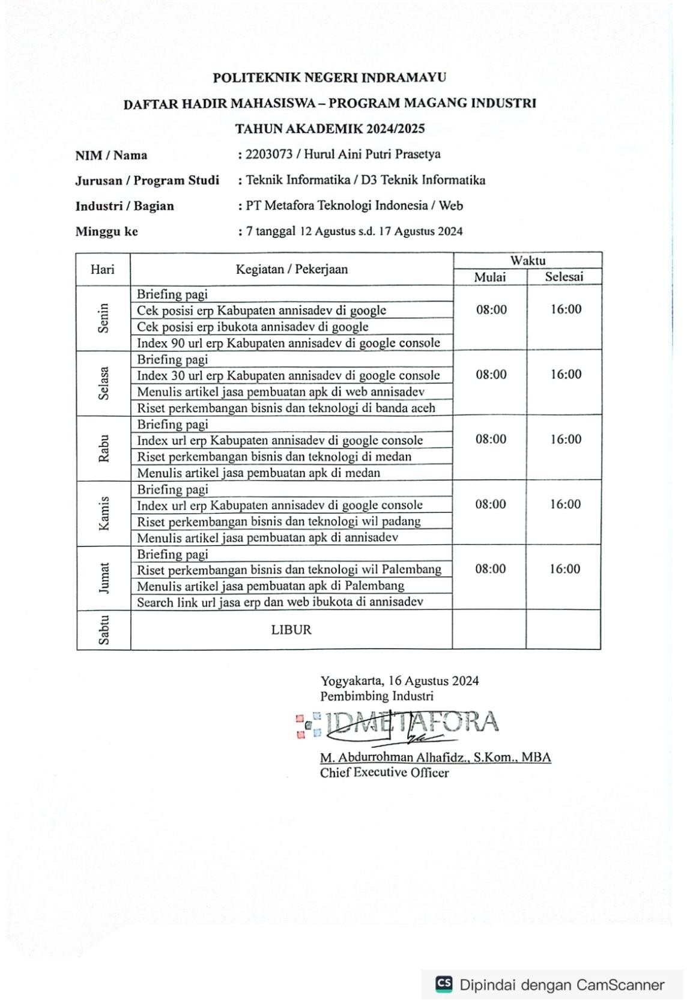

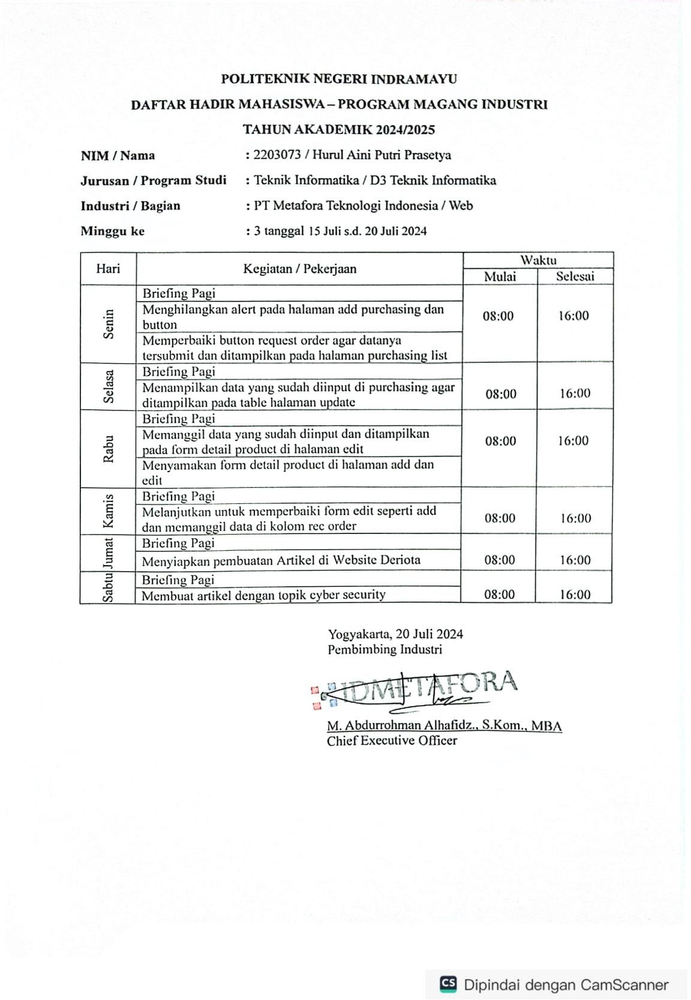

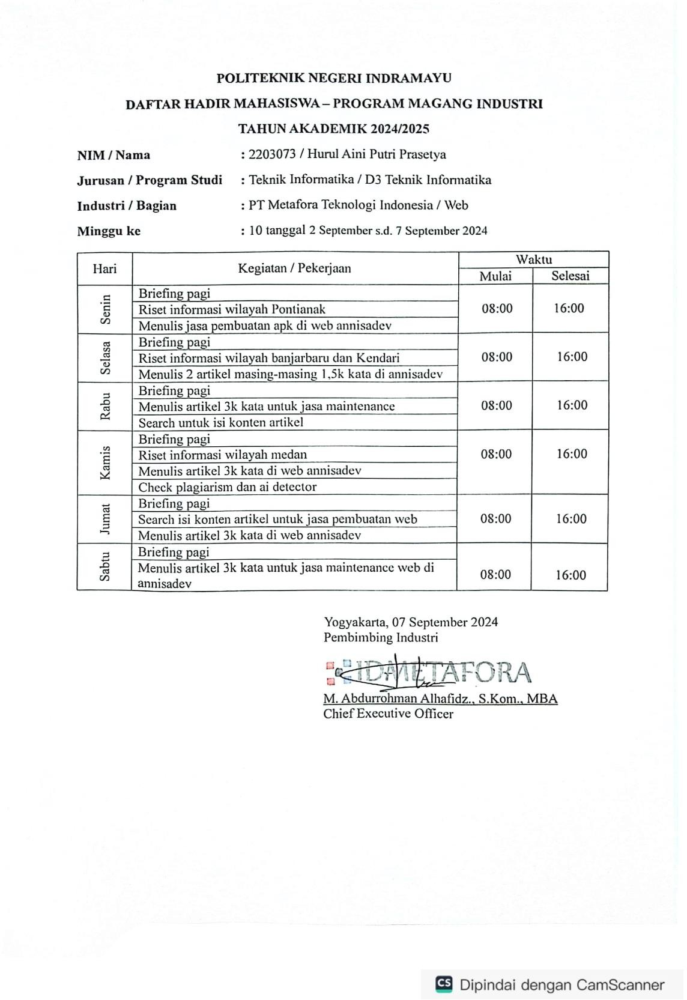

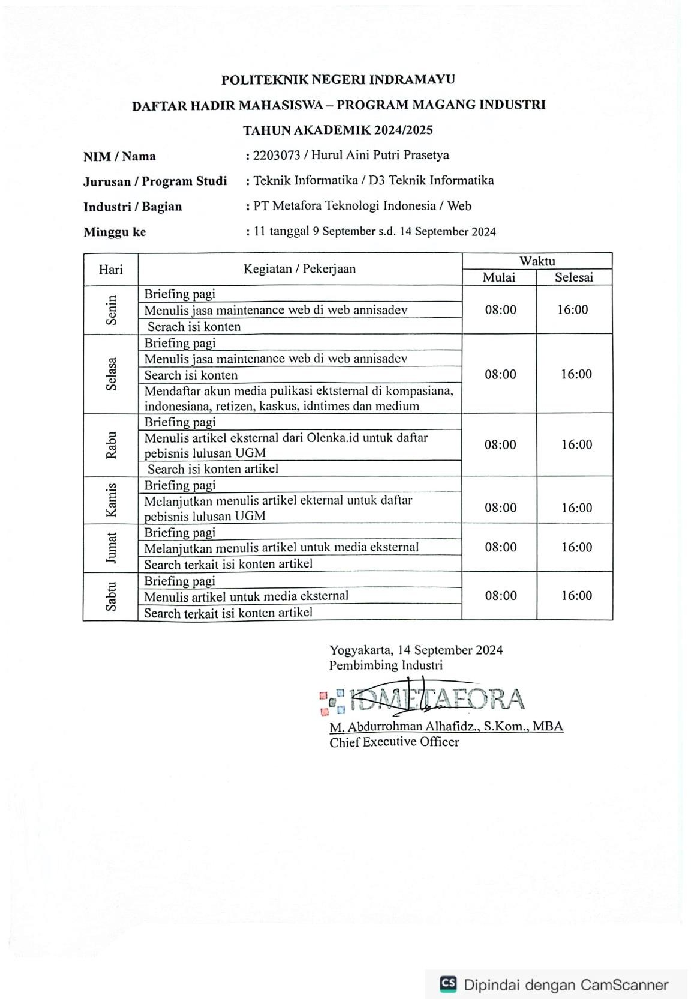

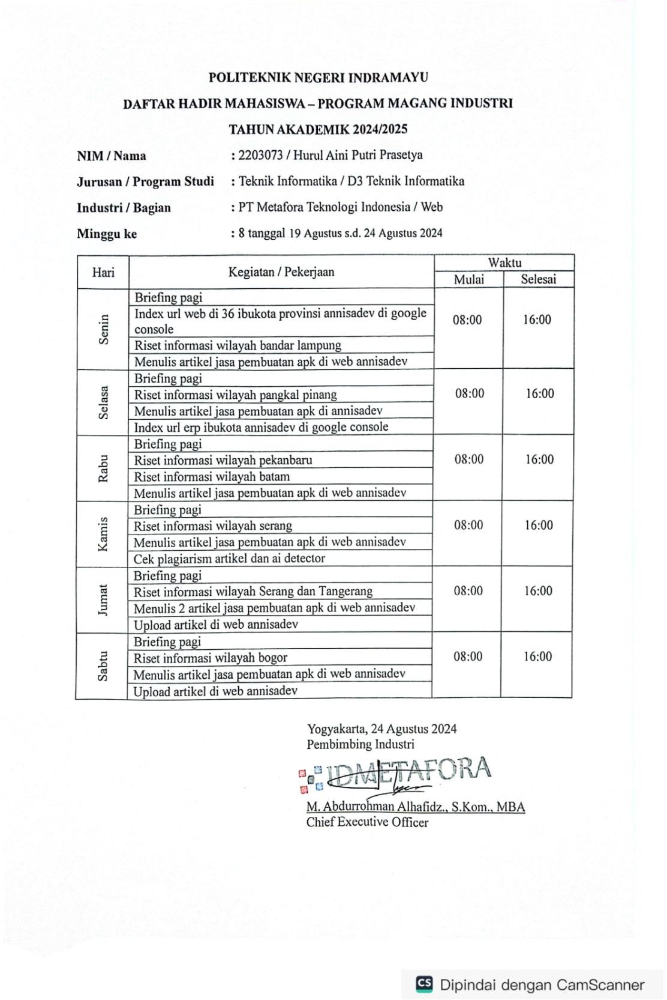

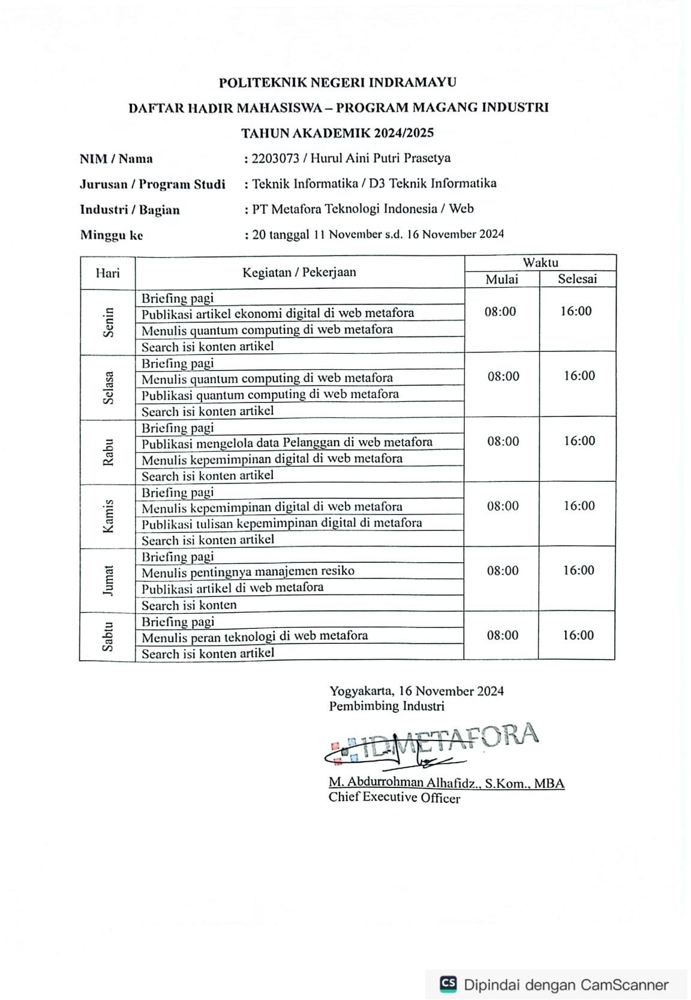

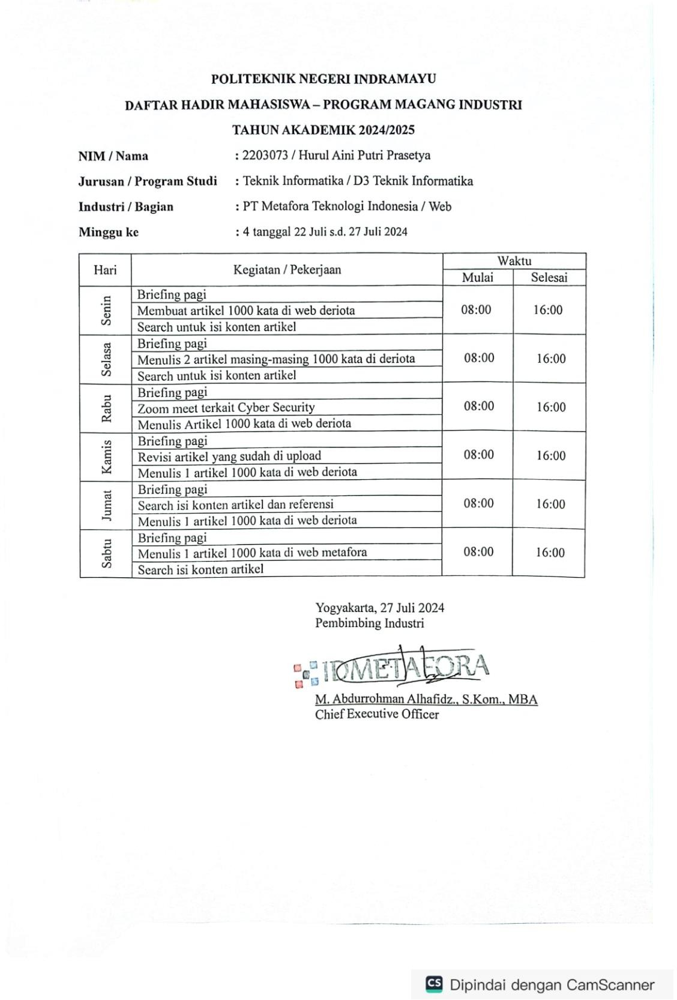

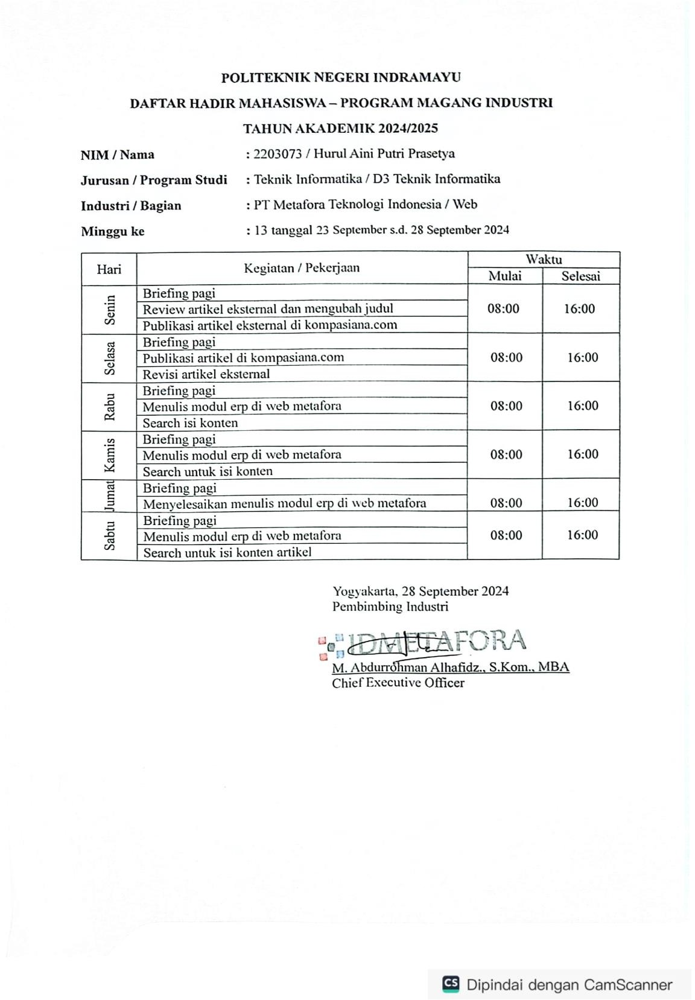

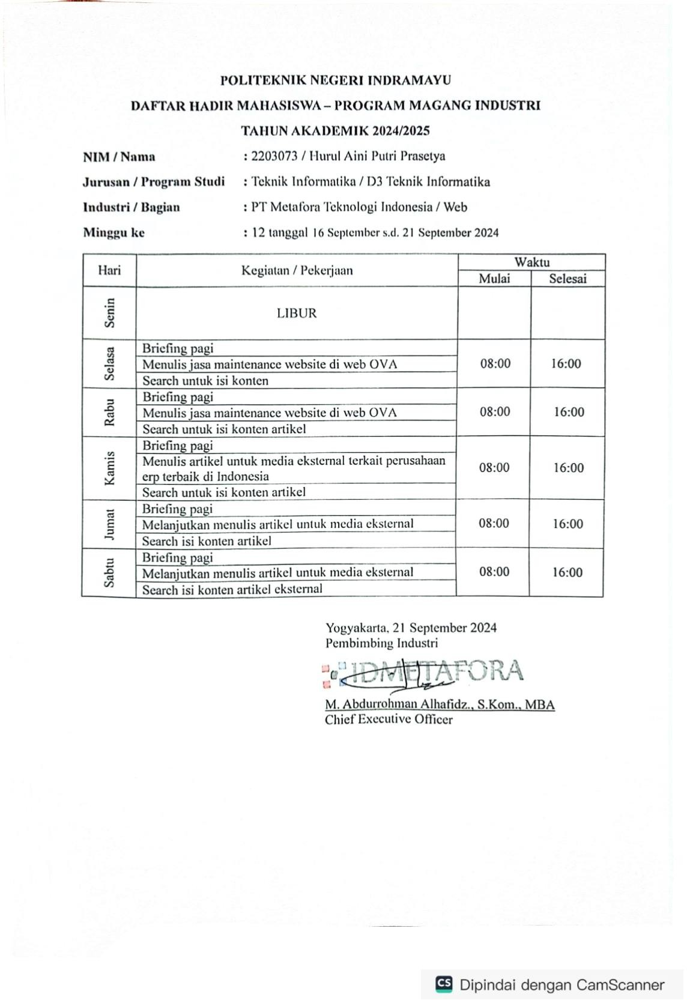

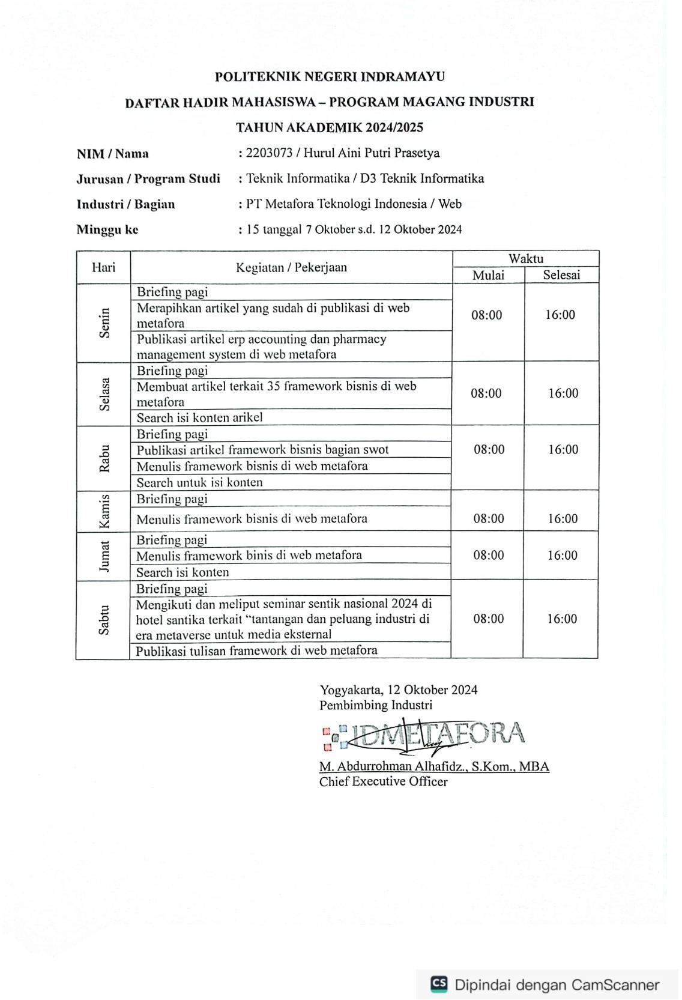


... dan 2527 gambar lainnya dalam cluster ini



Cluster 2, Size: 501
--------------------------------------------------



... dan 491 gambar lainnya dalam cluster ini



Cluster 3, Size: 444
--------------------------------------------------


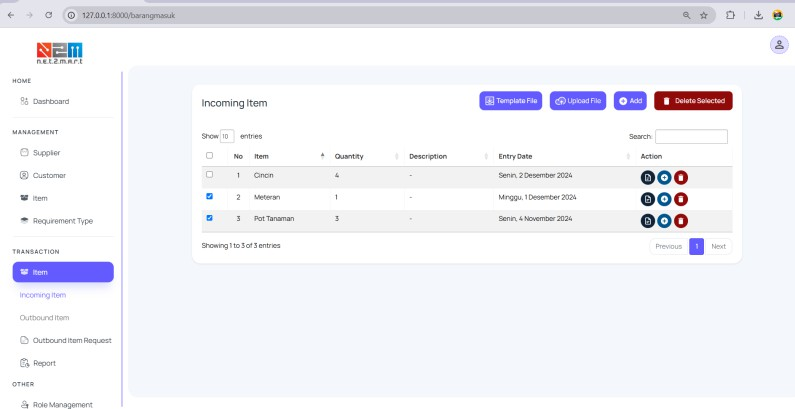

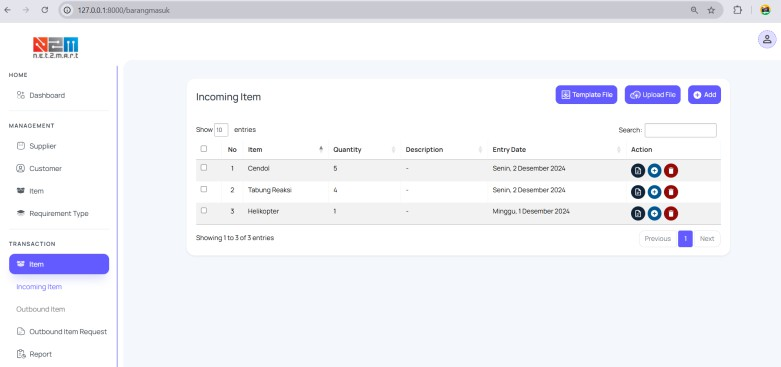

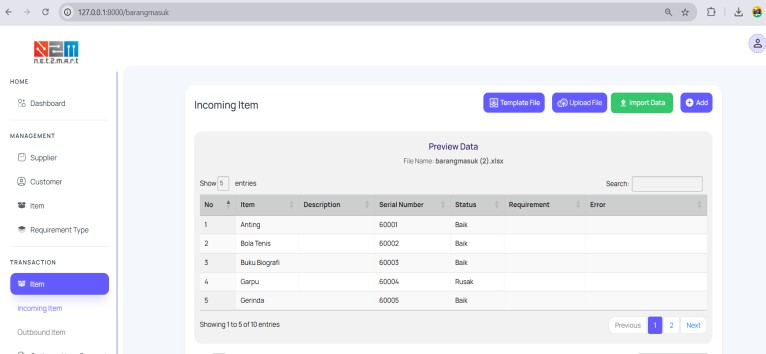

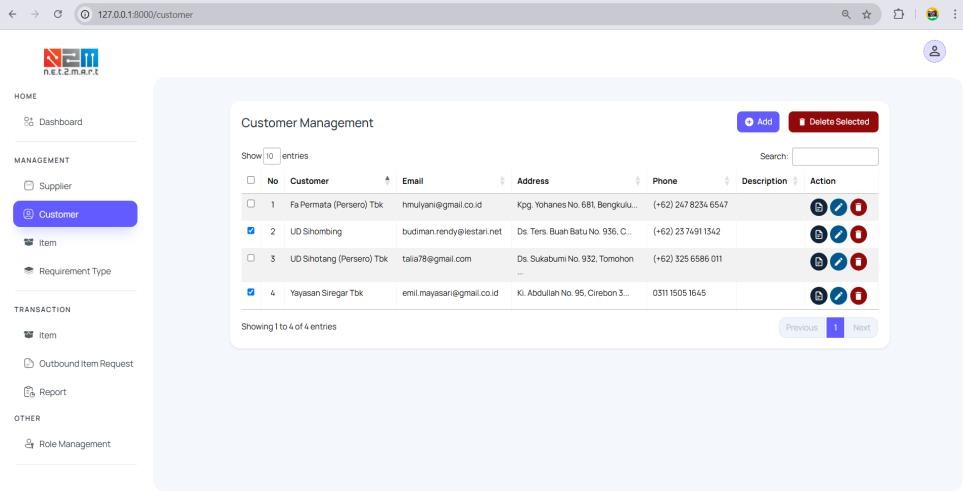

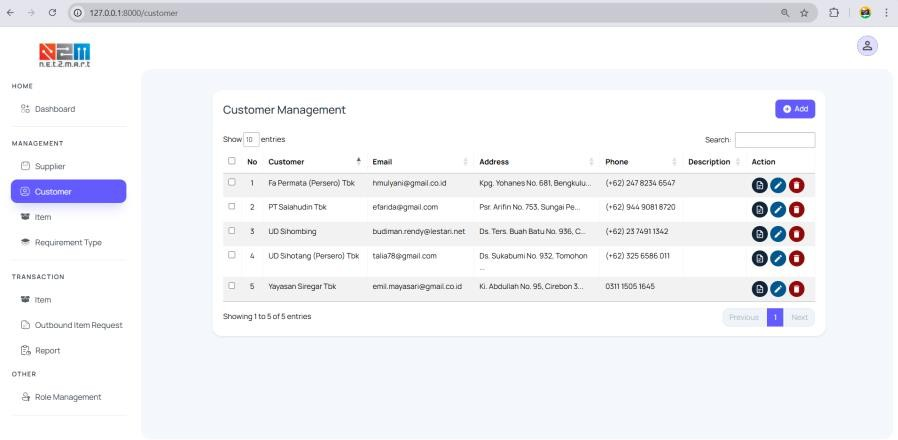

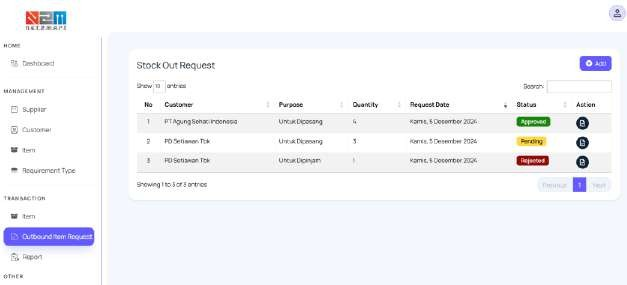

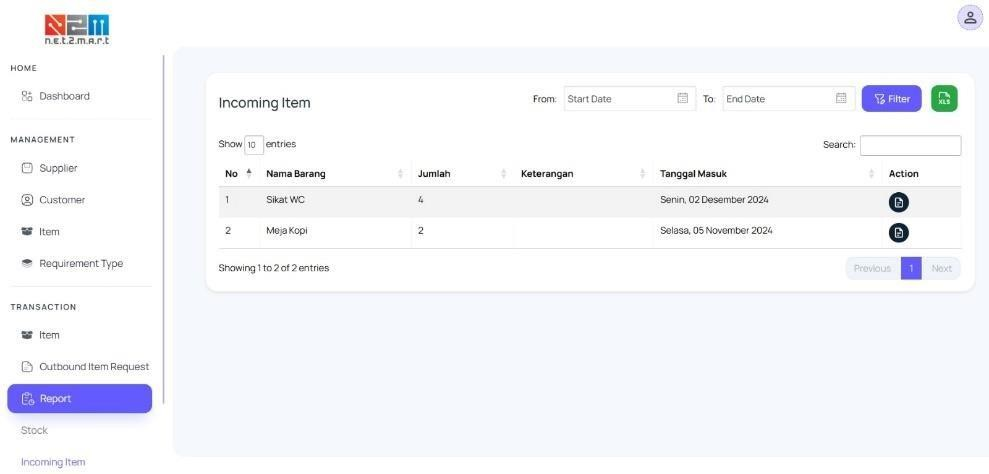

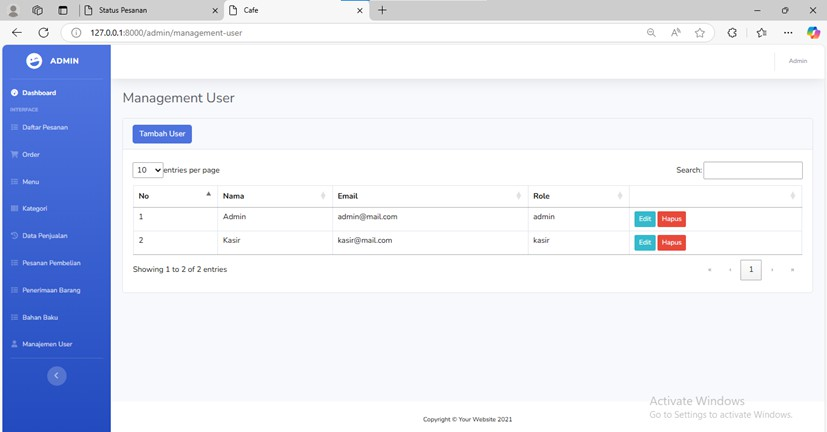

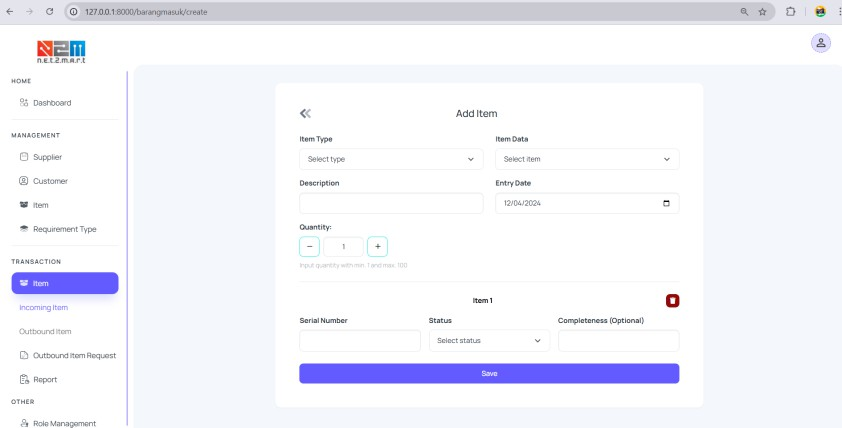

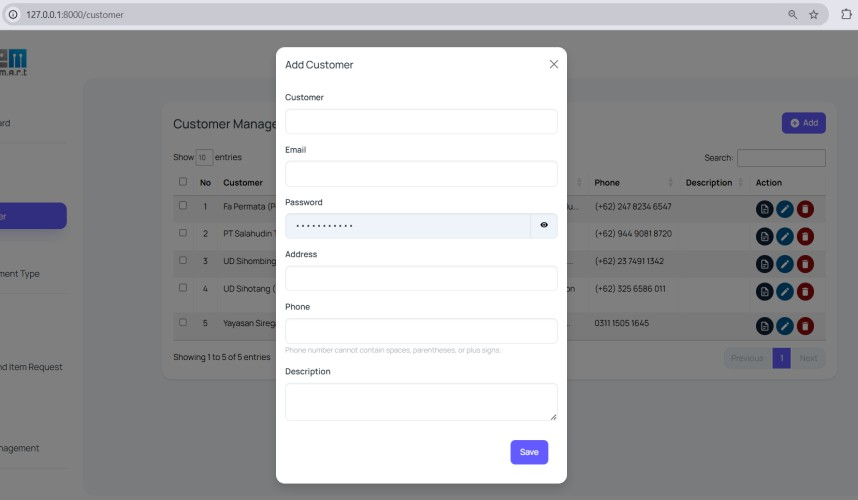


... dan 434 gambar lainnya dalam cluster ini



Cluster 4, Size: 187
--------------------------------------------------


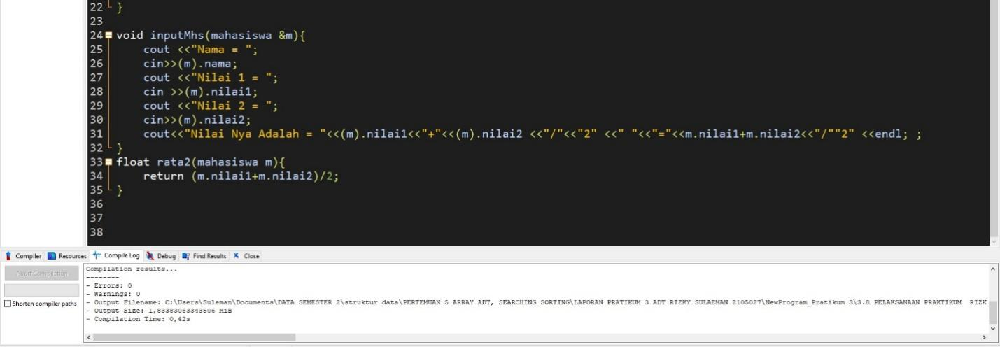

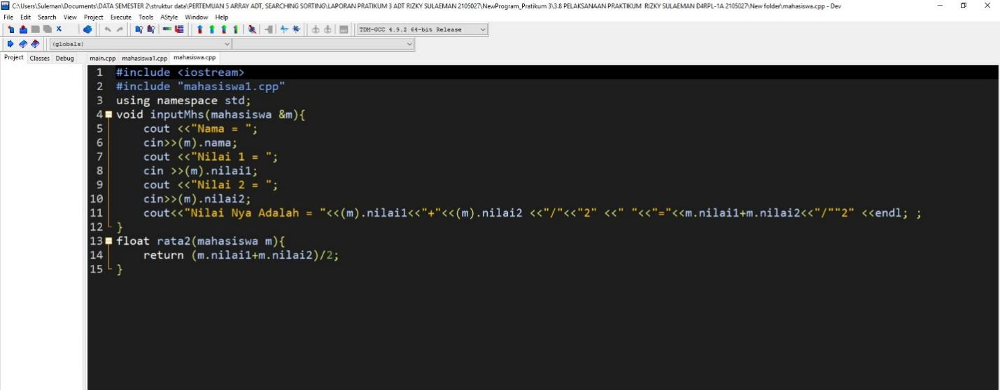

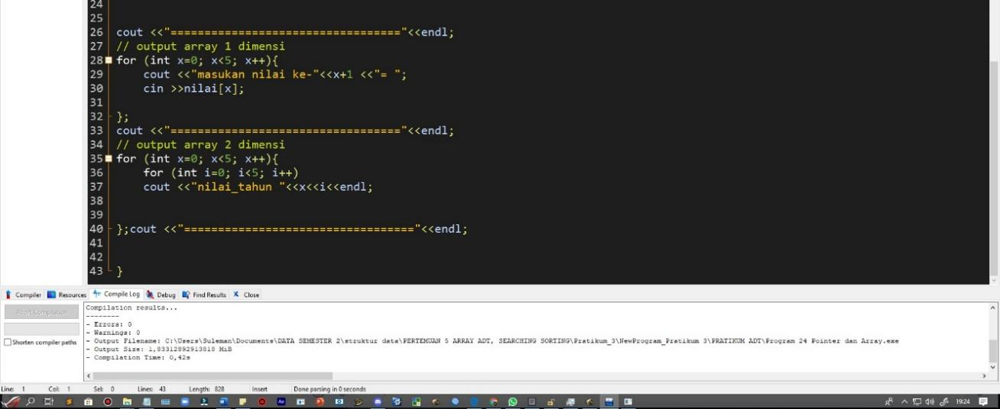

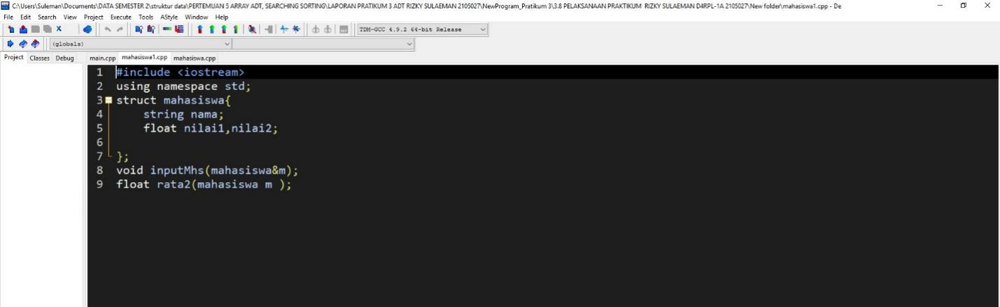

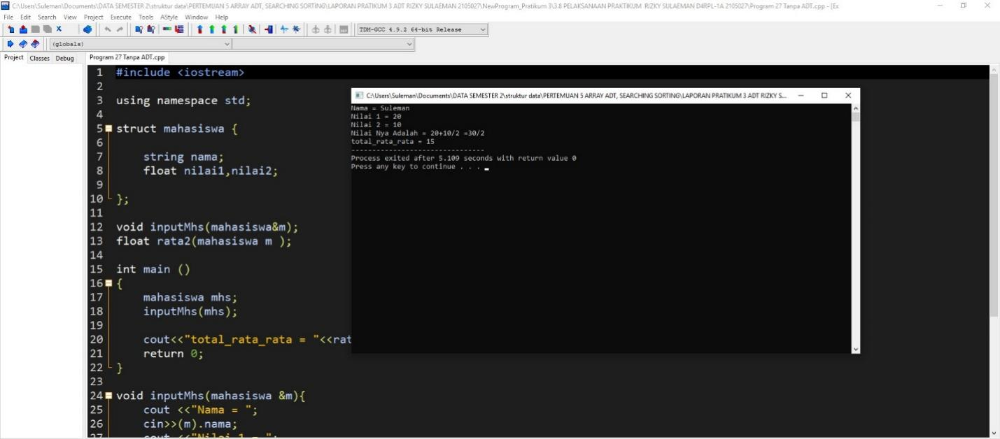

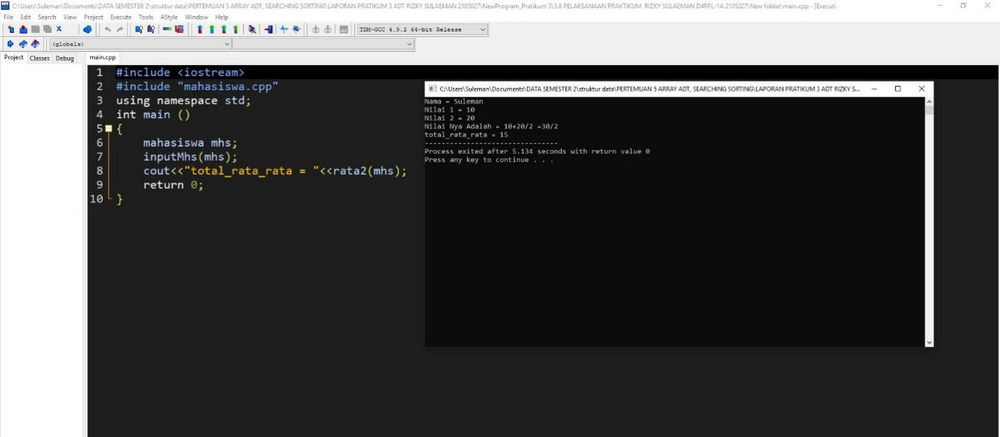

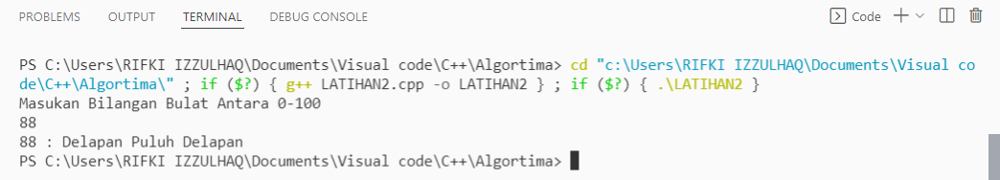

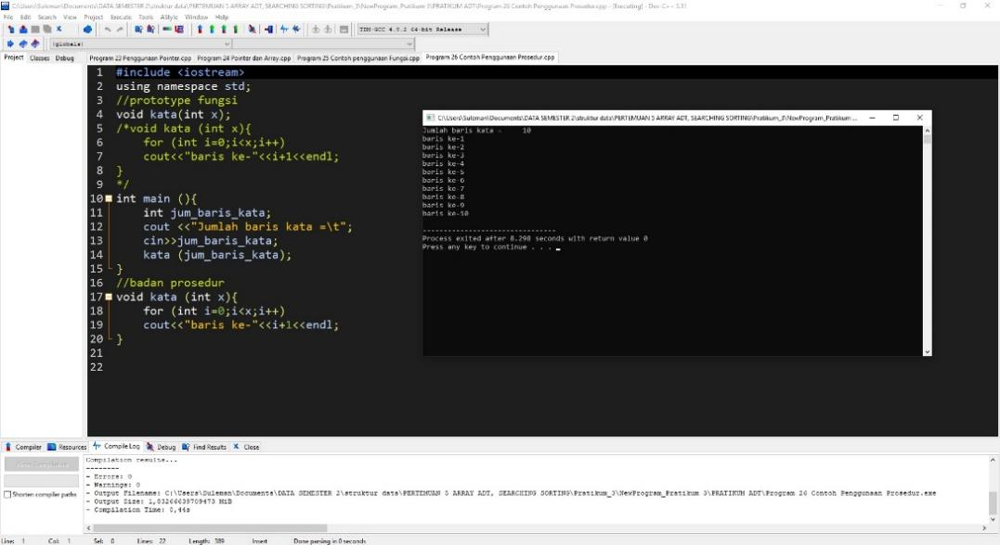

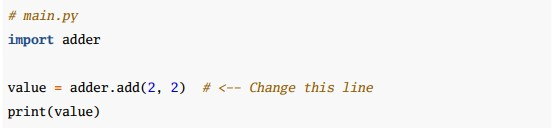

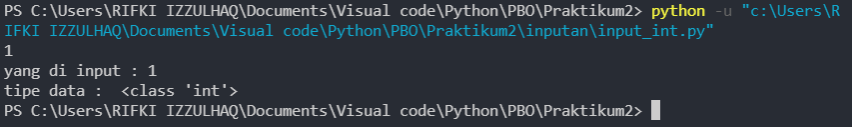


... dan 177 gambar lainnya dalam cluster ini



Cluster 5, Size: 172
--------------------------------------------------


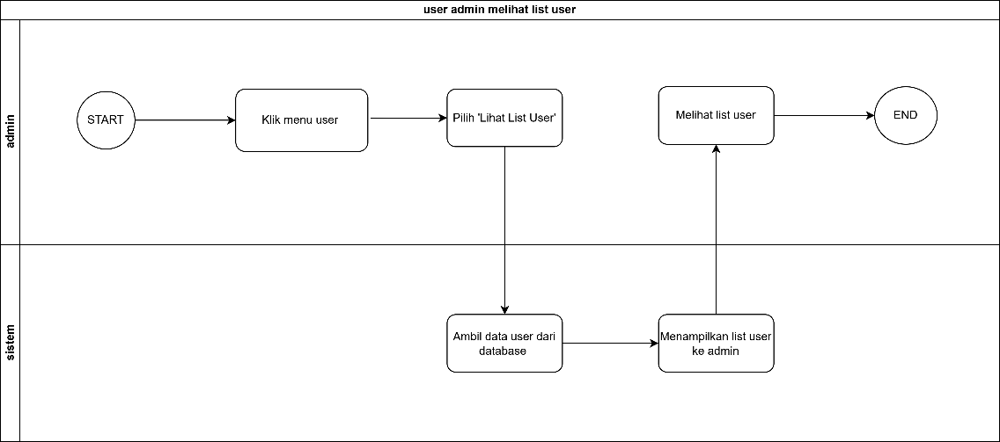

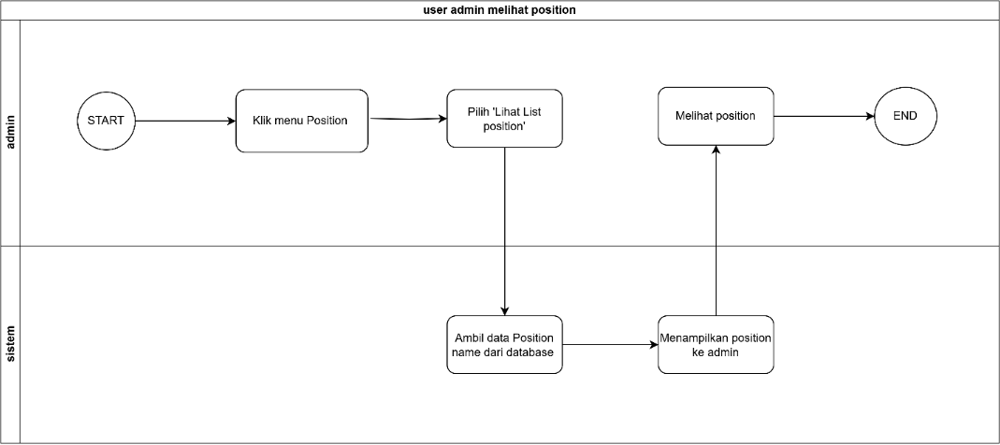

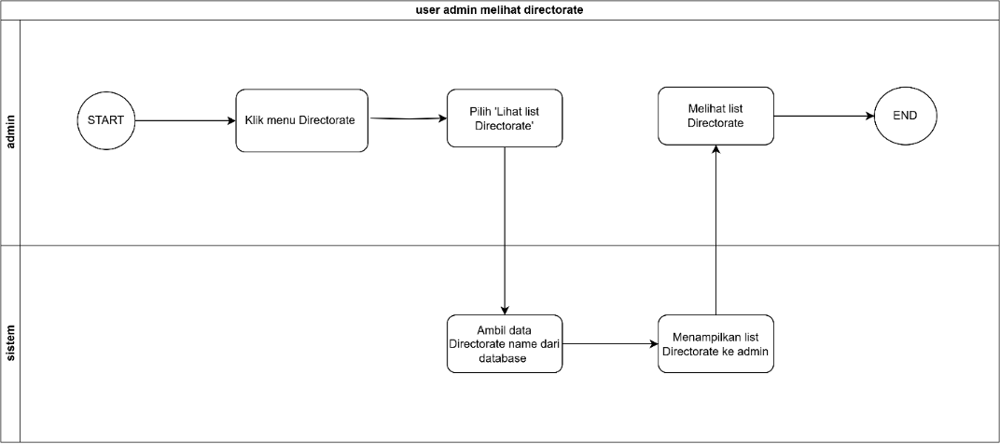

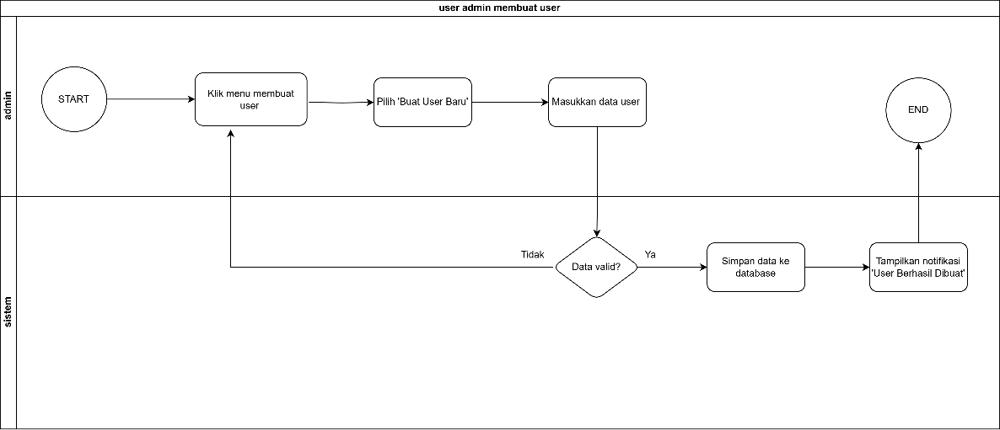

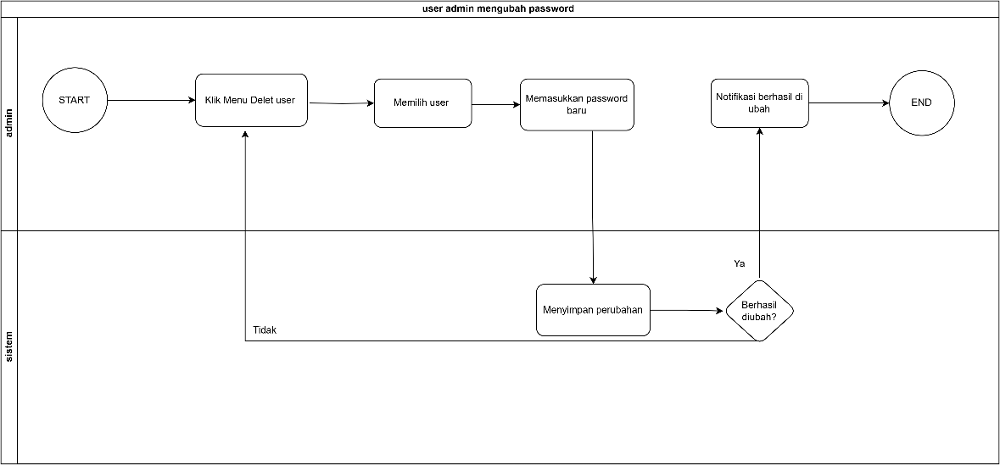

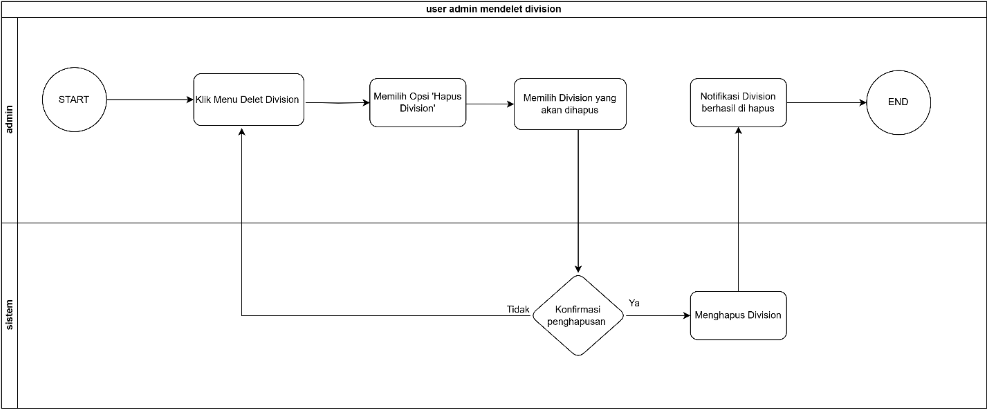

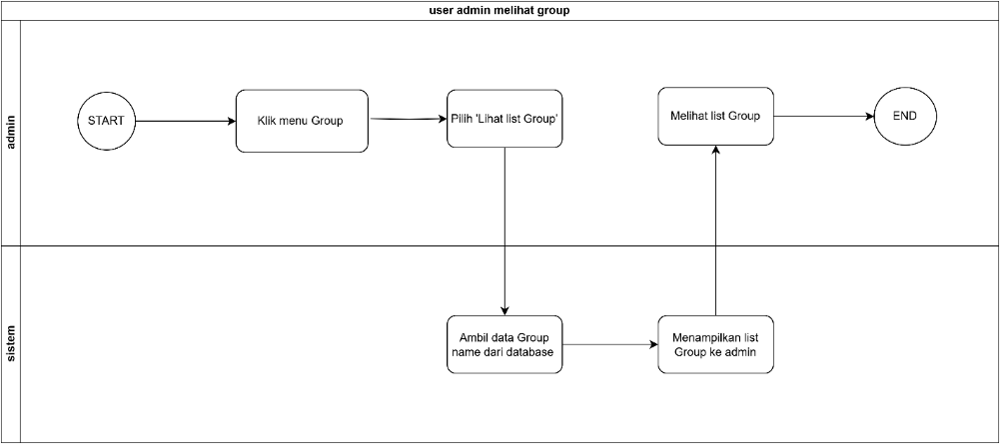

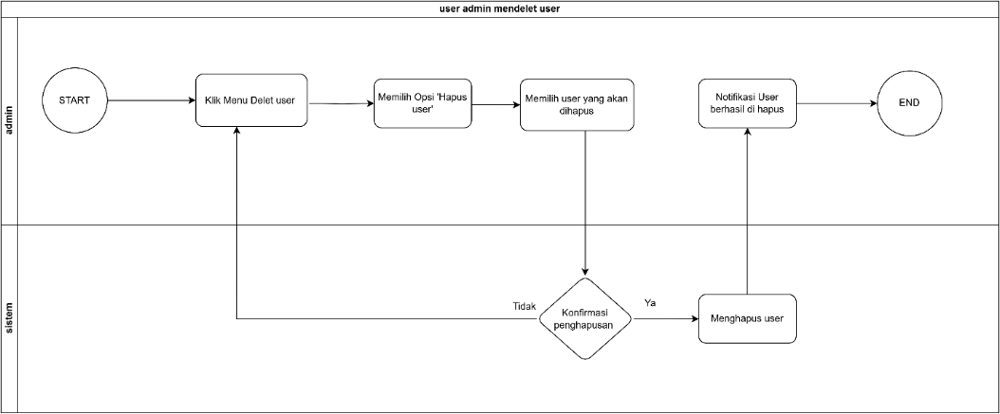

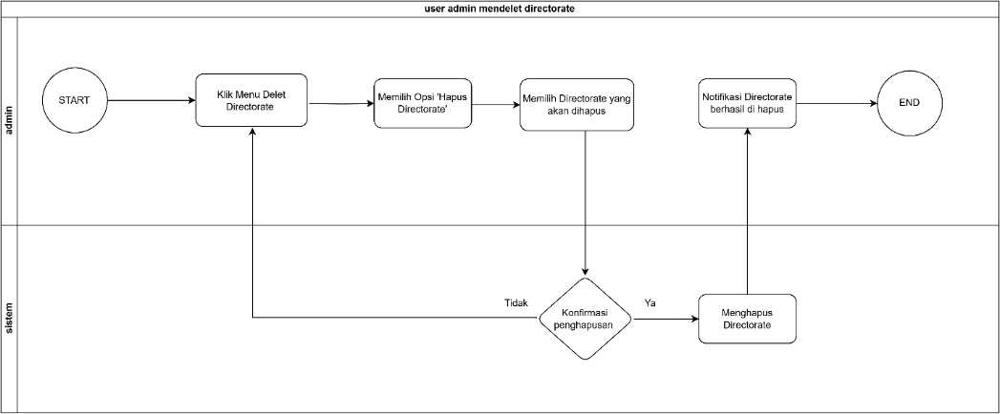

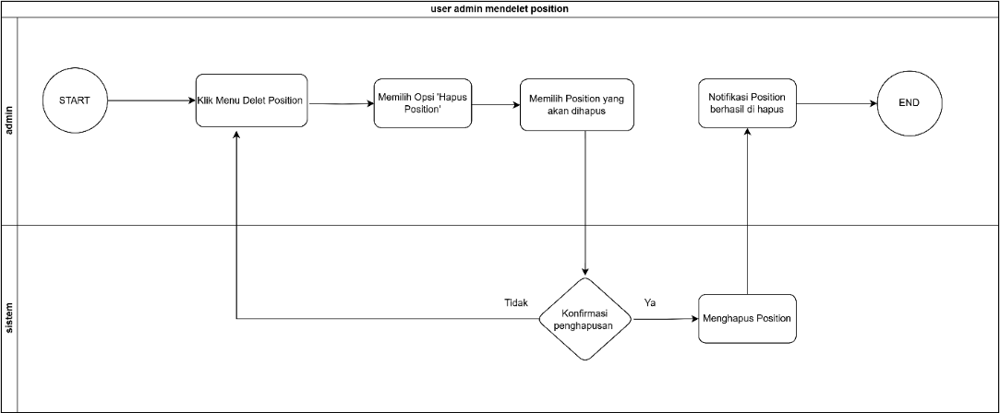


... dan 162 gambar lainnya dalam cluster ini



Ringkasan Total Clustering:
Total cluster yang terbentuk: 629
Menampilkan 5 cluster terbesar dari total 629 cluster
Cluster 1: 2537 gambar total, menampilkan 10 gambar
Cluster 2: 501 gambar total, menampilkan 10 gambar
Cluster 3: 444 gambar total, menampilkan 10 gambar
Cluster 4: 187 gambar total, menampilkan 10 gambar
Cluster 5: 172 gambar total, menampilkan 10 gambar


In [31]:
# Now we output the first 10 (largest) clusters
# for i, cluster in enumerate(clusters):
#     print(f"\nCluster {i+1}, Size: {len(cluster)}")
#     print("-" * 50)
    
#     # Output all images in this cluster
#     for idx in cluster:
#         display(IPImage(os.path.join(img_folder, img_names[idx]), width=200))
#     print("\n")

# Batasi jumlah cluster dan gambar yang ditampilkan
MAX_CLUSTERS = 5  # Jumlah cluster yang ditampilkan
MAX_IMAGES_PER_CLUSTER = 10  # Jumlah gambar per cluster

print(f"\nMenampilkan {MAX_CLUSTERS} cluster terbesar (max {MAX_IMAGES_PER_CLUSTER} gambar per cluster):")
for i, cluster in enumerate(clusters[:MAX_CLUSTERS]):  # Hanya tampilkan 5 cluster pertama
    print(f"\nCluster {i+1}, Size: {len(cluster)}")
    print("-" * 50)
    
    # Output hanya 10 gambar pertama dalam cluster ini
    for idx in cluster[:MAX_IMAGES_PER_CLUSTER]:
        display(IPImage(os.path.join(img_folder, img_names[idx]), width=200))
    
    # Tampilkan informasi jika ada gambar yang tidak ditampilkan
    if len(cluster) > MAX_IMAGES_PER_CLUSTER:
        print(f"\n... dan {len(cluster) - MAX_IMAGES_PER_CLUSTER} gambar lainnya dalam cluster ini")
    print("\n")

# Tampilkan ringkasan
print("\nRingkasan Total Clustering:")
print(f"Total cluster yang terbentuk: {len(clusters)}")
print(f"Menampilkan {MAX_CLUSTERS} cluster terbesar dari total {len(clusters)} cluster")
for i, cluster in enumerate(clusters[:MAX_CLUSTERS]):
    print(f"Cluster {i+1}: {len(cluster)} gambar total, menampilkan {min(len(cluster), MAX_IMAGES_PER_CLUSTER)} gambar")


### Find Similar Image

In [19]:
# Check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [33]:
test_img = Image.open('7.png')

In [21]:
test_emb = model.encode(test_img, convert_to_tensor=True)

In [22]:
if isinstance(test_emb, np.ndarray):
    test_emb = torch.from_numpy(test_emb)

In [23]:
test_emb = test_emb.to(device)
img_emb = img_emb.to(device)

In [24]:
#Compute cosine similarities 
cosine_scores = util.cos_sim(test_emb, img_emb)
print(cosine_scores)

tensor([[0.4636, 0.6188, 0.5703,  ..., 0.5443, 0.5347, 0.5806]],
       device='cuda:0')


In [25]:
%%time

#Find the pairs with the highest cosine similarity scores
pairs = []
for i in range(len(cosine_scores[0])):
    pairs.append({'index': i, 'score': cosine_scores[0][i]})

CPU times: total: 78.1 ms
Wall time: 49.3 ms


In [26]:
len(cosine_scores)

1

In [27]:
pairs = sorted(pairs, key=lambda x: x['score'], reverse=True)

In [28]:
pairs

[{'index': 9307, 'score': tensor(0.7769, device='cuda:0')},
 {'index': 5909, 'score': tensor(0.7766, device='cuda:0')},
 {'index': 3418, 'score': tensor(0.7764, device='cuda:0')},
 {'index': 6618, 'score': tensor(0.7750, device='cuda:0')},
 {'index': 3507, 'score': tensor(0.7749, device='cuda:0')},
 {'index': 5758, 'score': tensor(0.7745, device='cuda:0')},
 {'index': 3462, 'score': tensor(0.7736, device='cuda:0')},
 {'index': 3484, 'score': tensor(0.7736, device='cuda:0')},
 {'index': 2978, 'score': tensor(0.7726, device='cuda:0')},
 {'index': 3540, 'score': tensor(0.7718, device='cuda:0')},
 {'index': 3674, 'score': tensor(0.7708, device='cuda:0')},
 {'index': 6844, 'score': tensor(0.7706, device='cuda:0')},
 {'index': 3318, 'score': tensor(0.7683, device='cuda:0')},
 {'index': 3584, 'score': tensor(0.7675, device='cuda:0')},
 {'index': 5905, 'score': tensor(0.7654, device='cuda:0')},
 {'index': 2629, 'score': tensor(0.7648, device='cuda:0')},
 {'index': 6831, 'score': tensor(0.7645,

9307


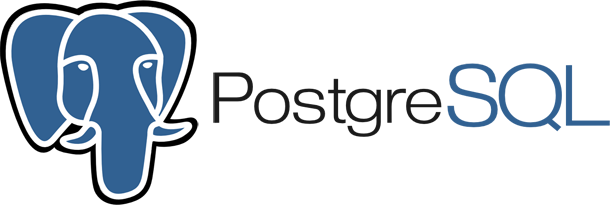

5909


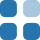

3418


6618


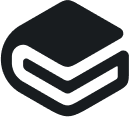

3507


5758


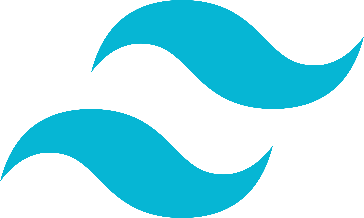

3462


3484


2978


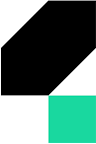

3540


CPU times: total: 15.6 ms
Wall time: 16.6 ms


In [32]:
%%time

for pair in pairs[0:10]:
    i = pair['index']
    #print("{} \t\t {} \t\t Score: {:.4f}".format(sentences[i], sentences[j], pair['score']))
    print(i)
    display(IPImage(os.path.join(img_folder, img_names[i]), width=200))


In [30]:
# Define output directory
output_base_dir = os.path.join('../hasil_clustering')

# # Pastikan folder hasil_clustering ada
# if not os.path.exists('hasil_clustering'):
#     os.makedirs('hasil_clustering')
#     print("Folder hasil_clustering dibuat")

# Buat atau bersihkan folder clustered_images di dalam hasil_clustering
if os.path.exists(output_base_dir):
    shutil.rmtree(output_base_dir)  # Remove if exists
os.makedirs(output_base_dir)

# Copy images to respective cluster folders
print(f"\nSaving clustered images to {output_base_dir}/")
for cluster_idx, cluster in enumerate(clusters):
    # Create cluster directory
    cluster_dir = os.path.join(output_base_dir, f'cluster_{cluster_idx+1}')
    os.makedirs(cluster_dir)
    
    # Copy images to cluster directory
    for img_idx in cluster:
        src_path = os.path.join(img_folder, img_names[img_idx])
        dst_path = os.path.join(cluster_dir, img_names[img_idx])
        shutil.copy2(src_path, dst_path)
    
    print(f"Cluster {cluster_idx+1}: {len(cluster)} images saved to {cluster_dir}/")


Saving clustered images to ../hasil_clustering/
Cluster 1: 2537 images saved to ../hasil_clustering\cluster_1/
Cluster 2: 501 images saved to ../hasil_clustering\cluster_2/
Cluster 3: 444 images saved to ../hasil_clustering\cluster_3/
Cluster 4: 187 images saved to ../hasil_clustering\cluster_4/
Cluster 5: 172 images saved to ../hasil_clustering\cluster_5/
Cluster 6: 159 images saved to ../hasil_clustering\cluster_6/
Cluster 7: 118 images saved to ../hasil_clustering\cluster_7/
Cluster 8: 114 images saved to ../hasil_clustering\cluster_8/
Cluster 9: 105 images saved to ../hasil_clustering\cluster_9/
Cluster 10: 92 images saved to ../hasil_clustering\cluster_10/
Cluster 11: 80 images saved to ../hasil_clustering\cluster_11/
Cluster 12: 67 images saved to ../hasil_clustering\cluster_12/
Cluster 13: 56 images saved to ../hasil_clustering\cluster_13/
Cluster 14: 48 images saved to ../hasil_clustering\cluster_14/
Cluster 15: 42 images saved to ../hasil_clustering\cluster_15/
Cluster 16: 40